# Advanced Visualizations and Model Interpretability

This notebook provides advanced visualizations including:
- 3D defect pattern analysis
- Spatial defect distribution
- Model attention visualizations
- Feature space analysis

In [1]:
import sys
sys.path.append('../src')

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import yaml
from pathlib import Path
import cv2
from scipy import ndimage
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import warnings
warnings.filterwarnings('ignore')

from data import WaferDataProcessor

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

## 1. Load Data

In [2]:
with open('../configs/config.yaml', 'r') as f:
    config = yaml.safe_load(f)

processor = WaferDataProcessor(config)
df = processor.load_data()

class_names = processor.class_names
print(f"Loaded {len(df)} wafer maps across {len(class_names)} classes")

Loading data from /Users/nishanthegde/Desktop/wafer-defects-detection/data/LSWMD.pkl...
Initial data shape: (811457, 6)
Columns: ['waferMap', 'dieSize', 'lotName', 'waferIndex', 'trianTestLabel', 'failureType']
Data shape after cleaning: (172950, 8)
Loaded 172950 wafer maps across 9 classes


## 2. 3D Wafer Map Visualization

In [3]:
def plot_wafer_3d(wafer_map, title="3D Wafer Map"):
    """
    Create 3D surface plot of wafer map where defect density is the Z-axis.
    """
    wafer_array = np.array(wafer_map)
    
    x = np.arange(wafer_array.shape[1])
    y = np.arange(wafer_array.shape[0])
    X, Y = np.meshgrid(x, y)
    
    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(111, projection='3d')
    
    surf = ax.plot_surface(X, Y, wafer_array, cmap='viridis', 
                           edgecolor='none', alpha=0.9)
    
    ax.set_xlabel('X Position', fontsize=10)
    ax.set_ylabel('Y Position', fontsize=10)
    ax.set_zlabel('Defect Level', fontsize=10)
    ax.set_title(title, fontsize=12, fontweight='bold', pad=20)
    
    fig.colorbar(surf, shrink=0.5, aspect=5)
    
    ax.view_init(elev=30, azim=45)
    
    return fig, ax

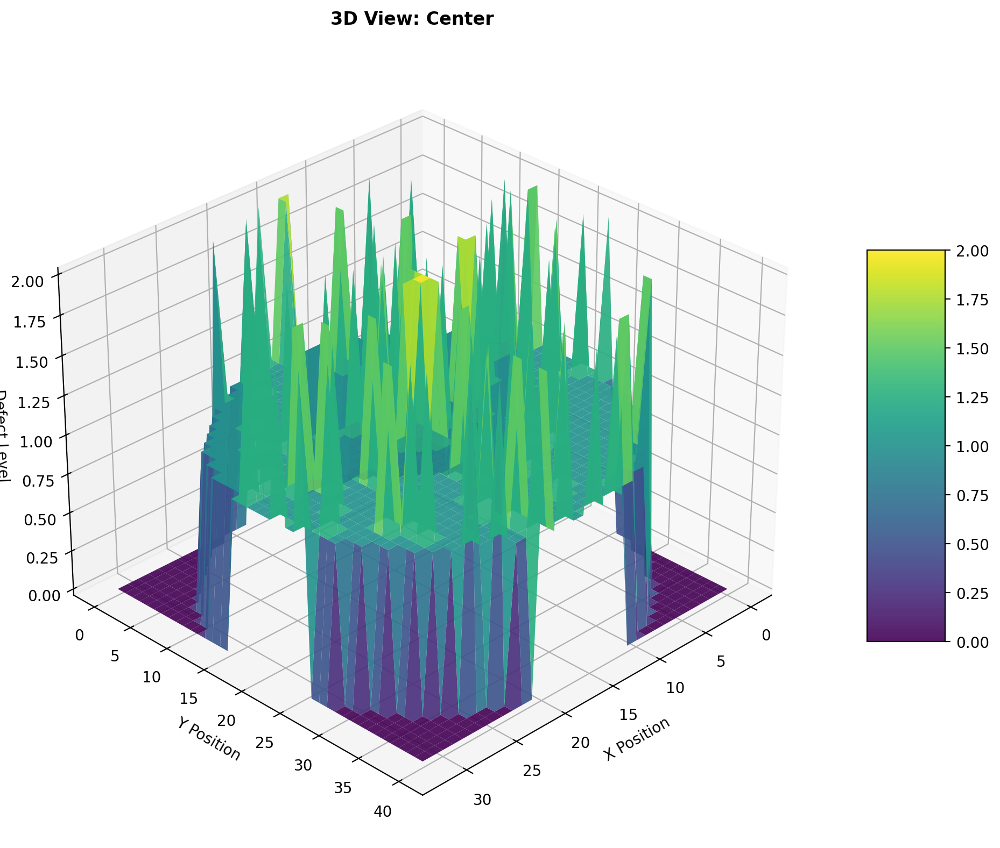

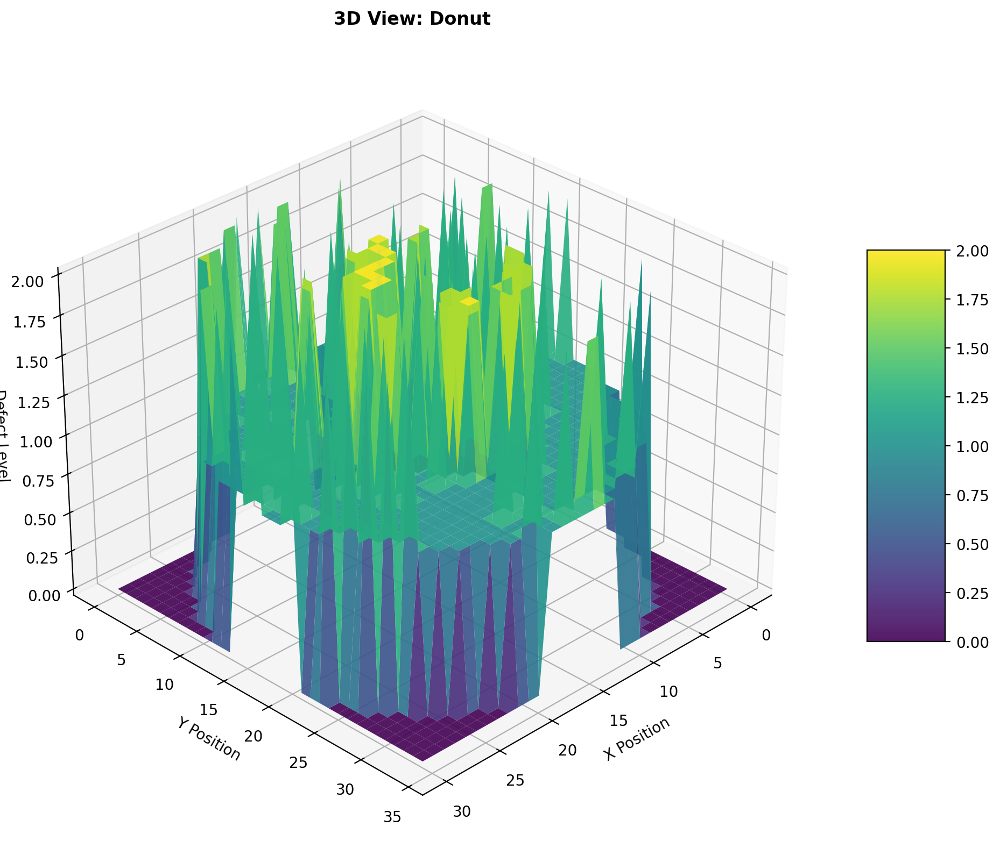

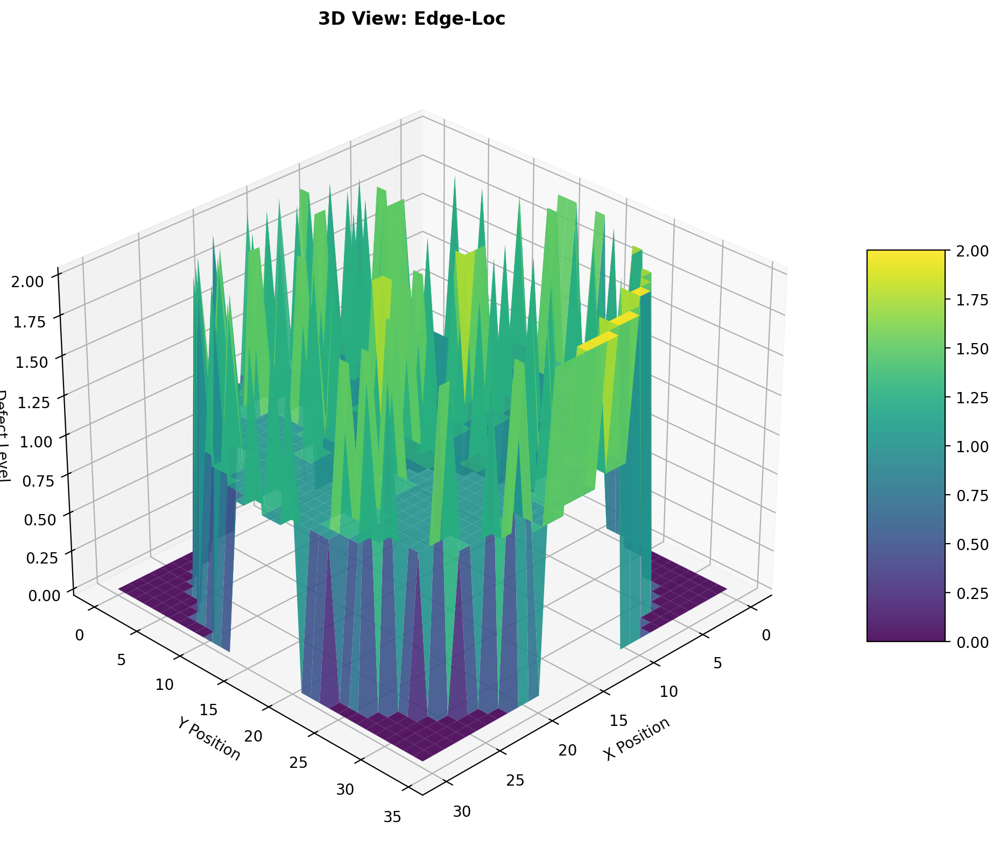

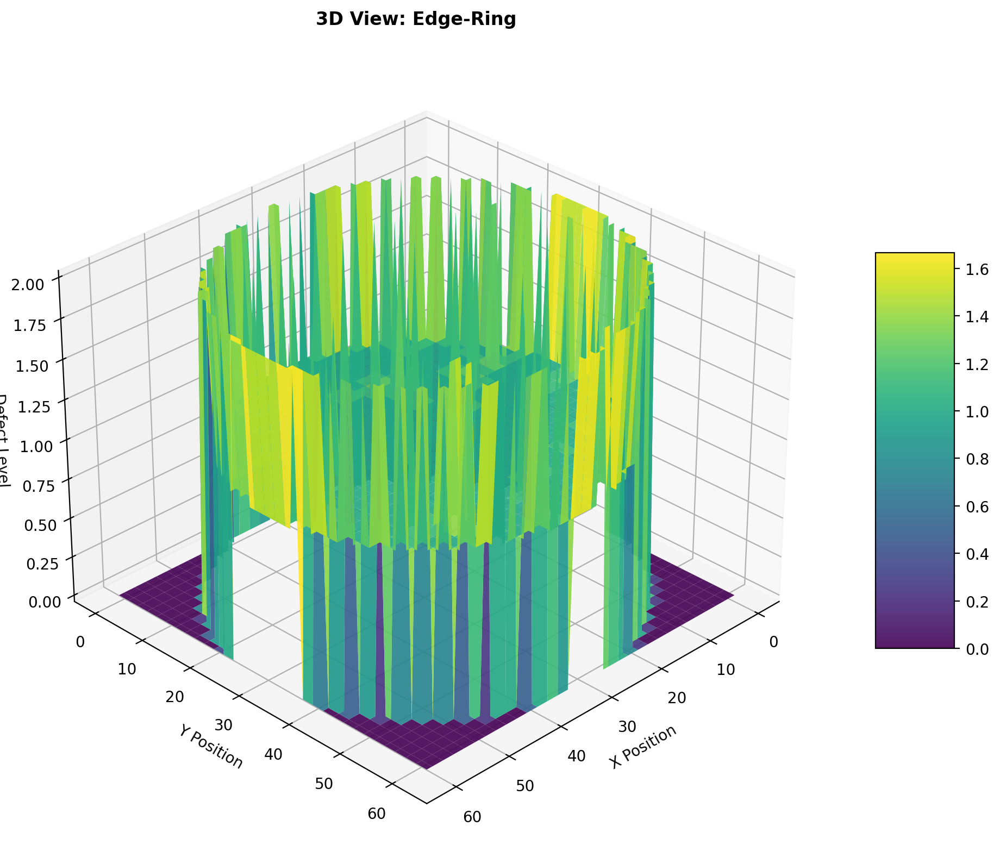

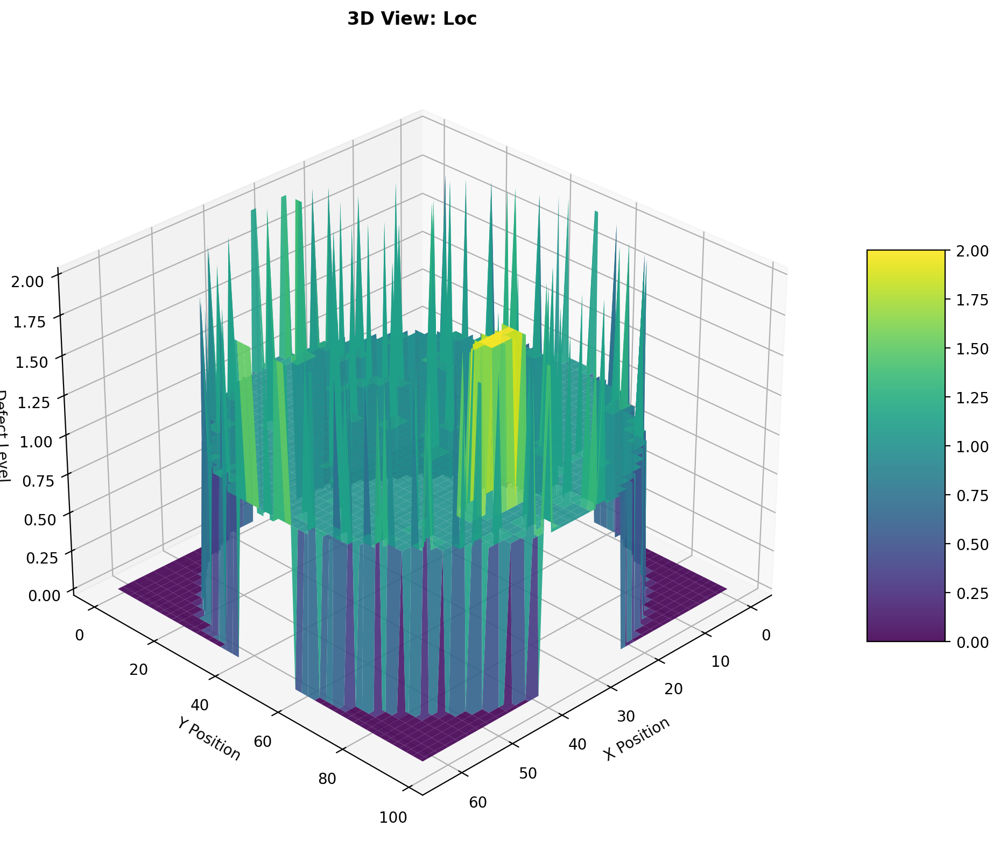

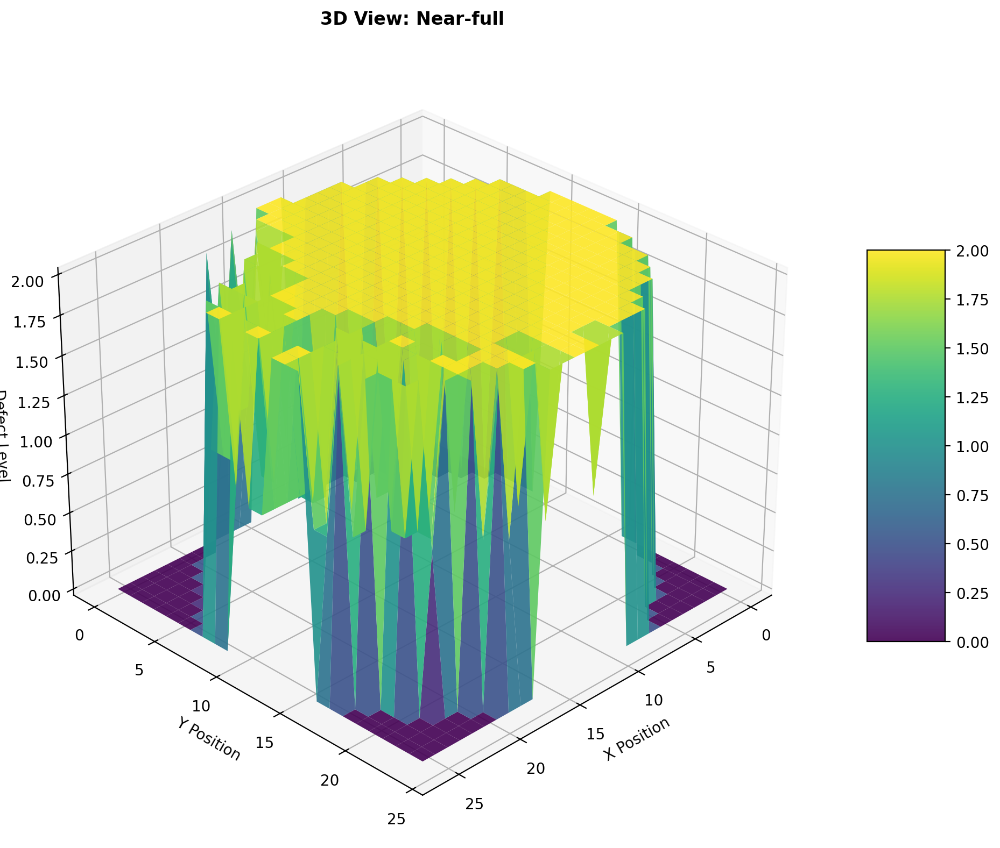

In [4]:
for class_name in class_names[:6]:
    class_df = df[df['failureType_clean'] == class_name]
    
    if len(class_df) > 0:
        sample_idx = np.random.randint(0, len(class_df))
        wafer_map = class_df.iloc[sample_idx]['waferMap']
        
        fig, ax = plot_wafer_3d(wafer_map, f"3D View: {class_name}")
        plt.tight_layout()
        plt.savefig(f'../outputs/visualizations/3d_wafer_{class_name}.png', dpi=300, bbox_inches='tight')
        plt.show()

## 3. Interactive 3D Plotly Visualizations

In [5]:
def create_interactive_3d_wafer(wafer_map, title="Interactive 3D Wafer Map"):
    """
    Create interactive 3D surface plot using Plotly.
    """
    wafer_array = np.array(wafer_map)
    
    fig = go.Figure(data=[go.Surface(
        z=wafer_array,
        colorscale='Viridis',
        colorbar=dict(title="Defect Level")
    )])
    
    fig.update_layout(
        title=title,
        scene=dict(
            xaxis_title='X Position',
            yaxis_title='Y Position',
            zaxis_title='Defect Level',
            camera=dict(
                eye=dict(x=1.5, y=1.5, z=1.3)
            )
        ),
        width=800,
        height=600
    )
    
    return fig

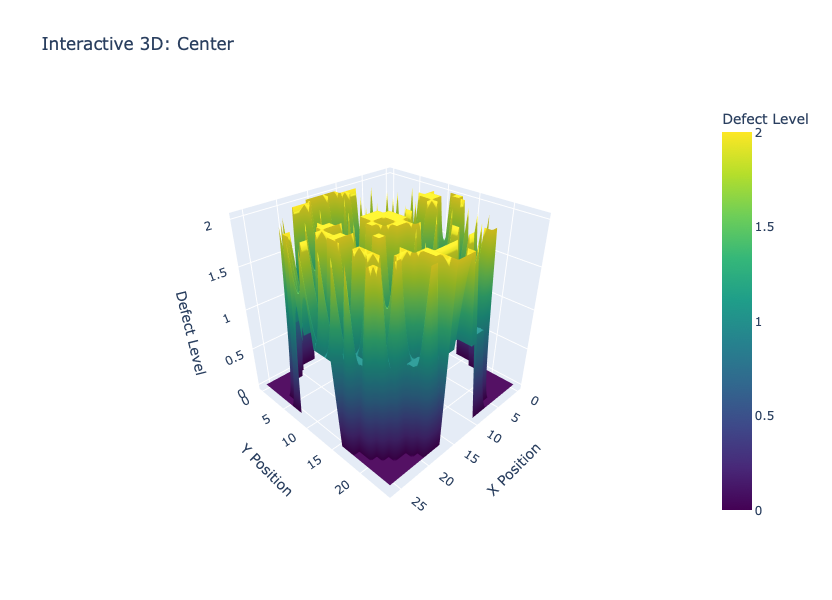

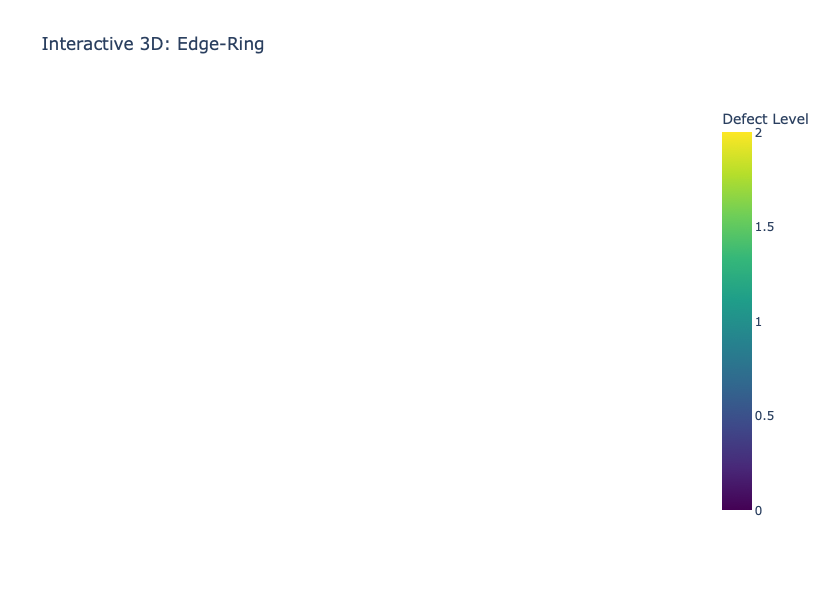

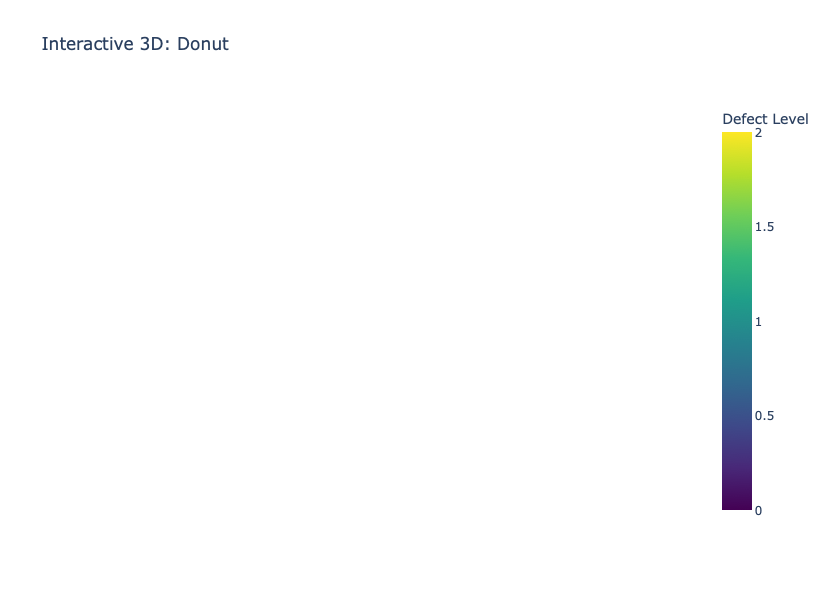

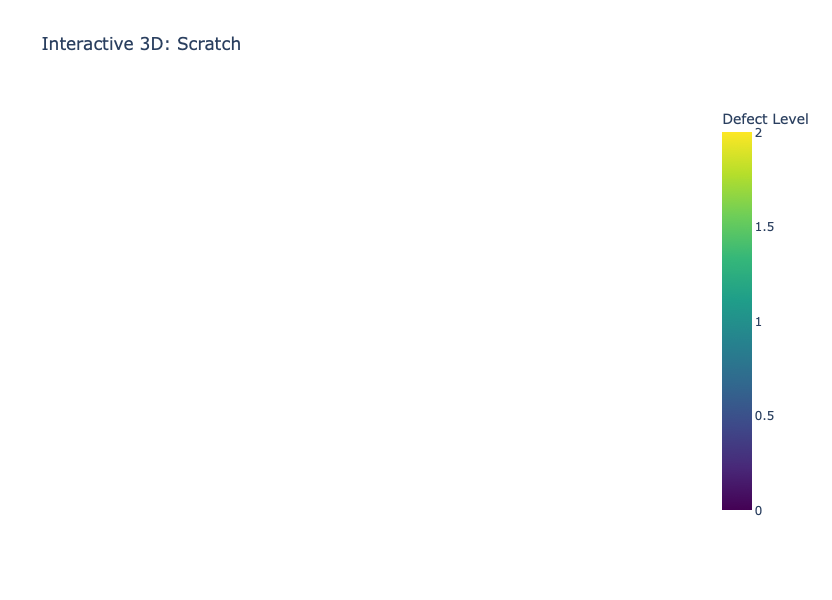

In [6]:
sample_classes = ['Center', 'Edge-Ring', 'Donut', 'Scratch']

for class_name in sample_classes:
    class_df = df[df['failureType_clean'] == class_name]
    
    if len(class_df) > 0:
        sample_idx = np.random.randint(0, len(class_df))
        wafer_map = class_df.iloc[sample_idx]['waferMap']
        
        fig = create_interactive_3d_wafer(wafer_map, f"Interactive 3D: {class_name}")
        fig.write_html(f'../outputs/visualizations/interactive_3d_{class_name}.html')
        fig.show()

## 4. Spatial Defect Distribution Heatmaps

In [7]:
def compute_average_defect_map(df_subset, target_size=(100, 100)):
    """
    Compute average defect map across all wafers in subset.
    """
    accumulated_map = np.zeros(target_size)
    count_map = np.zeros(target_size)
    
    for idx in range(len(df_subset)):
        wafer_map = np.array(df_subset.iloc[idx]['waferMap'])
        
        if wafer_map.size > 0:
            resized = cv2.resize(wafer_map.astype(float), target_size, interpolation=cv2.INTER_LINEAR)
            
            mask = resized > 0
            accumulated_map += resized
            count_map += mask.astype(float)
    
    average_map = np.divide(accumulated_map, count_map, 
                            where=count_map > 0, 
                            out=np.zeros_like(accumulated_map))
    
    return average_map

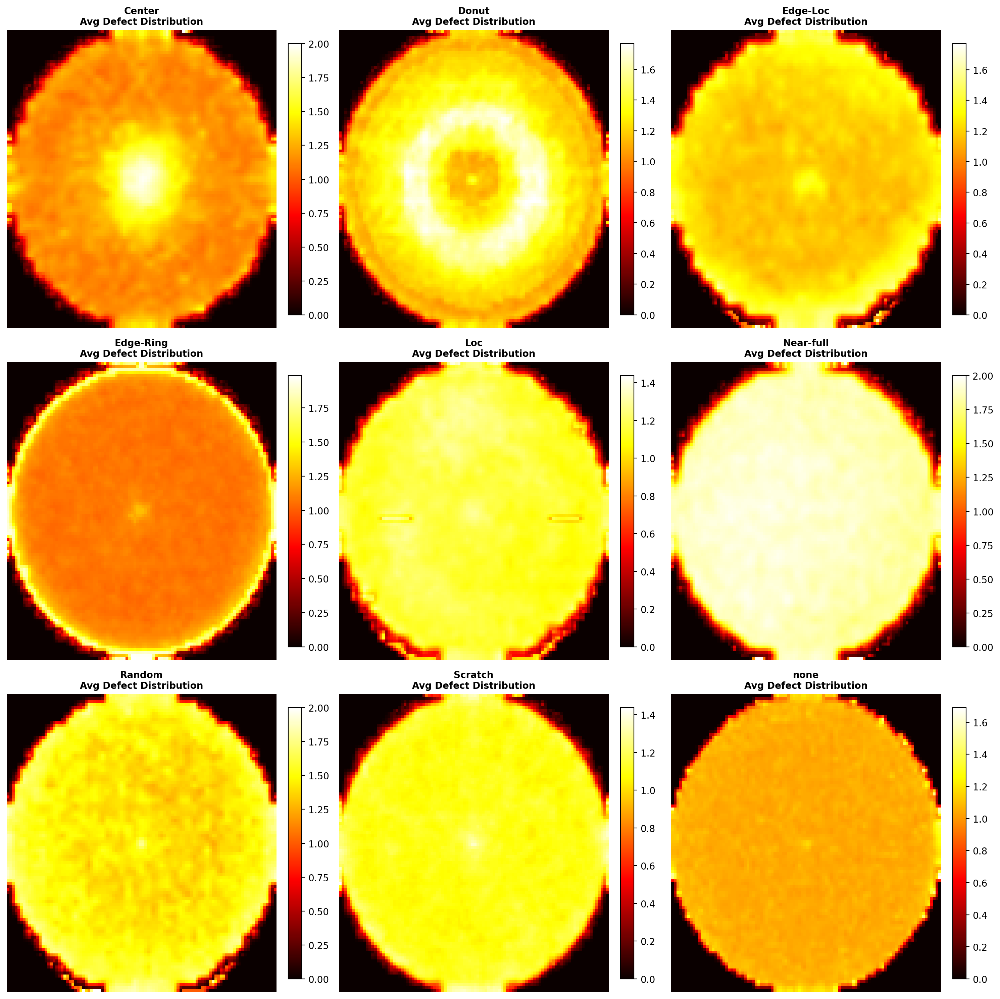

In [8]:
fig, axes = plt.subplots(3, 3, figsize=(15, 15))
axes = axes.flatten()

for idx, class_name in enumerate(class_names):
    class_df = df[df['failureType_clean'] == class_name]
    
    if len(class_df) > 5:
        avg_map = compute_average_defect_map(class_df.head(min(100, len(class_df))))
        
        im = axes[idx].imshow(avg_map, cmap='hot', aspect='auto')
        axes[idx].set_title(f'{class_name}\nAvg Defect Distribution', 
                           fontsize=10, fontweight='bold')
        axes[idx].axis('off')
        plt.colorbar(im, ax=axes[idx], fraction=0.046, pad=0.04)
    else:
        axes[idx].text(0.5, 0.5, 'Insufficient samples', 
                      ha='center', va='center', fontsize=10)
        axes[idx].set_title(class_name, fontsize=10, fontweight='bold')
        axes[idx].axis('off')

plt.tight_layout()
plt.savefig('../outputs/visualizations/spatial_defect_distribution.png', dpi=300, bbox_inches='tight')
plt.show()

## 5. Defect Pattern Clustering Visualization

In [9]:
def extract_features(wafer_map, target_size=(32, 32)):
    """
    Extract flattened features from wafer map.
    """
    wafer_array = np.array(wafer_map)
    
    if wafer_array.size == 0:
        return np.zeros(target_size[0] * target_size[1])
    
    resized = cv2.resize(wafer_array.astype(float), target_size, interpolation=cv2.INTER_LINEAR)
    
    return resized.flatten()

print("Extracting features from sample wafers...")
sample_size = min(2000, len(df))
sample_indices = np.random.choice(len(df), sample_size, replace=False)
sample_df = df.iloc[sample_indices]

features = []
labels = []

for idx in range(len(sample_df)):
    wafer_map = sample_df.iloc[idx]['waferMap']
    label = sample_df.iloc[idx]['failureType_clean']
    
    feat = extract_features(wafer_map)
    features.append(feat)
    labels.append(label)

features = np.array(features)
print(f"Feature matrix shape: {features.shape}")

Extracting features from sample wafers...
Feature matrix shape: (2000, 1024)


### 5.1 PCA Visualization

Performing PCA...
Explained variance ratio: [0.10371426 0.06894838]
Total variance explained: 0.1727


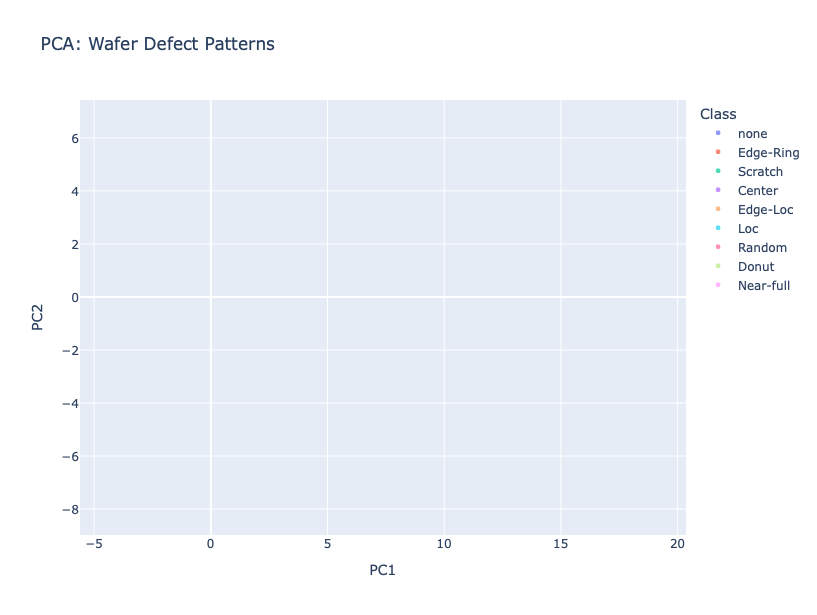

In [10]:
print("Performing PCA...")
pca = PCA(n_components=2)
pca_features = pca.fit_transform(features)

print(f"Explained variance ratio: {pca.explained_variance_ratio_}")
print(f"Total variance explained: {pca.explained_variance_ratio_.sum():.4f}")

pca_df = pd.DataFrame({
    'PC1': pca_features[:, 0],
    'PC2': pca_features[:, 1],
    'Class': labels
})

fig = px.scatter(
    pca_df, 
    x='PC1', 
    y='PC2', 
    color='Class',
    title='PCA: Wafer Defect Patterns',
    width=900,
    height=600,
    opacity=0.7
)

fig.update_traces(marker=dict(size=5))
fig.write_html('../outputs/visualizations/pca_visualization.html')
fig.show()

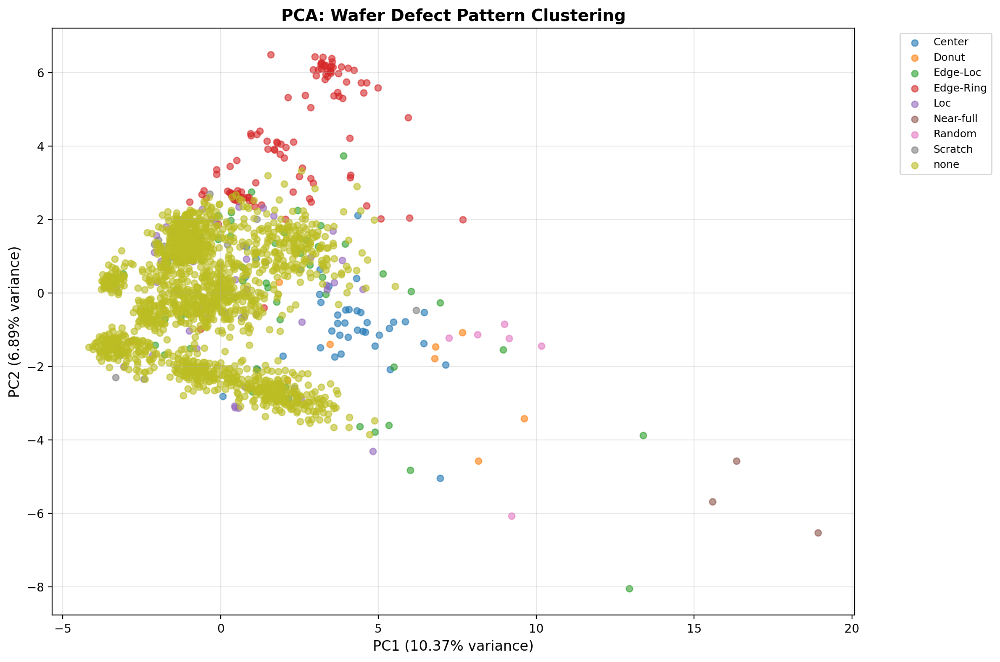

In [11]:
plt.figure(figsize=(12, 8))

for class_name in class_names:
    mask = pca_df['Class'] == class_name
    plt.scatter(pca_df[mask]['PC1'], pca_df[mask]['PC2'], 
               label=class_name, alpha=0.6, s=30)

plt.xlabel(f'PC1 ({pca.explained_variance_ratio_[0]:.2%} variance)', fontsize=12)
plt.ylabel(f'PC2 ({pca.explained_variance_ratio_[1]:.2%} variance)', fontsize=12)
plt.title('PCA: Wafer Defect Pattern Clustering', fontsize=14, fontweight='bold')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=9)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.savefig('../outputs/visualizations/pca_clustering.png', dpi=300, bbox_inches='tight')
plt.show()

### 5.2 t-SNE Visualization

Performing t-SNE (this may take a few minutes)...


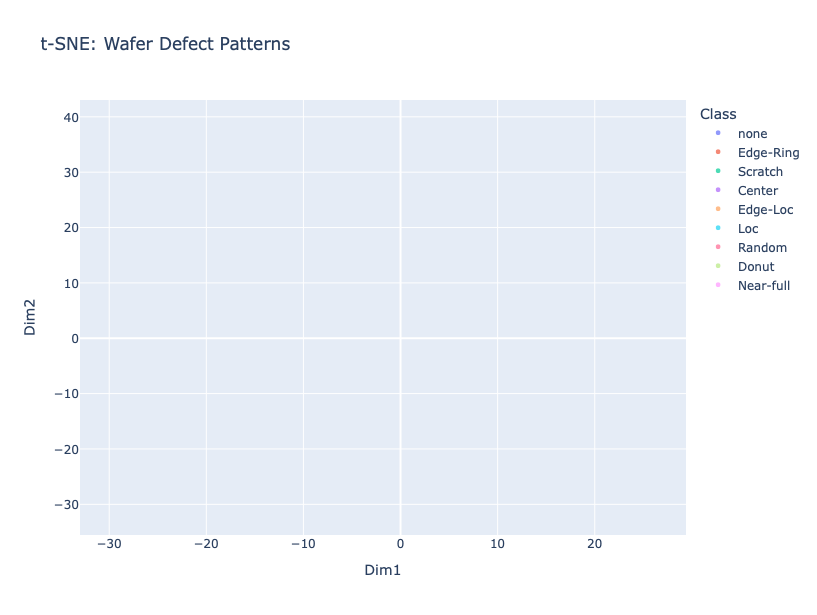

In [13]:
print("Performing t-SNE (this may take a few minutes)...")
tsne = TSNE(n_components=2, random_state=42, perplexity=30, max_iter=1000)
tsne_features = tsne.fit_transform(features)

tsne_df = pd.DataFrame({
    'Dim1': tsne_features[:, 0],
    'Dim2': tsne_features[:, 1],
    'Class': labels
})

fig = px.scatter(
    tsne_df, 
    x='Dim1', 
    y='Dim2', 
    color='Class',
    title='t-SNE: Wafer Defect Patterns',
    width=900,
    height=600,
    opacity=0.7
)

fig.update_traces(marker=dict(size=5))
fig.write_html('../outputs/visualizations/tsne_visualization.html')
fig.show()

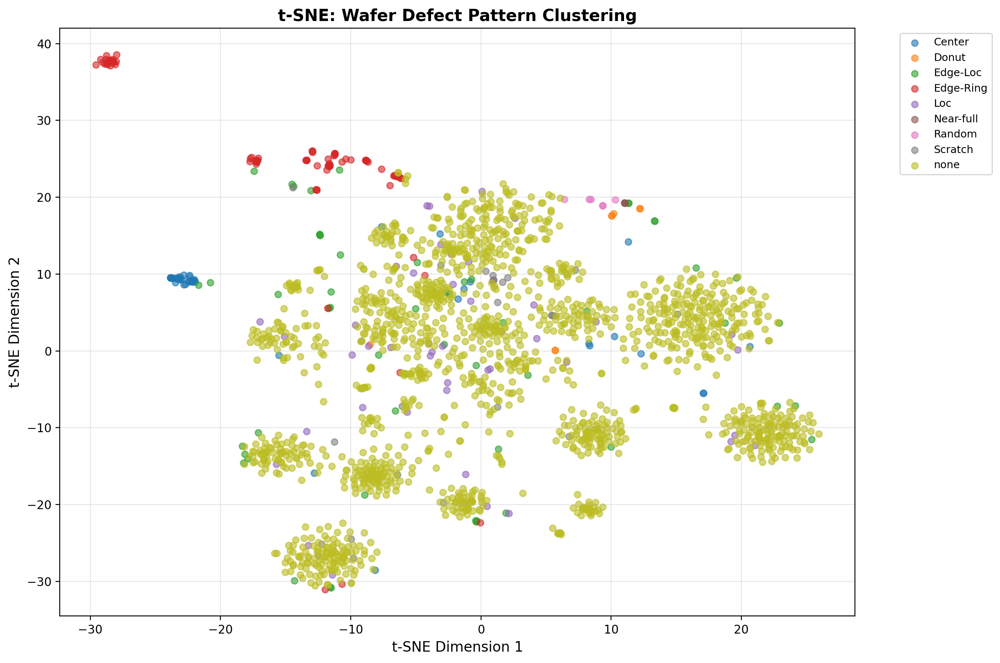

In [14]:
plt.figure(figsize=(12, 8))

for class_name in class_names:
    mask = tsne_df['Class'] == class_name
    plt.scatter(tsne_df[mask]['Dim1'], tsne_df[mask]['Dim2'], 
               label=class_name, alpha=0.6, s=30)

plt.xlabel('t-SNE Dimension 1', fontsize=12)
plt.ylabel('t-SNE Dimension 2', fontsize=12)
plt.title('t-SNE: Wafer Defect Pattern Clustering', fontsize=14, fontweight='bold')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=9)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.savefig('../outputs/visualizations/tsne_clustering.png', dpi=300, bbox_inches='tight')
plt.show()

## 6. 3D Scatter Plot: Multi-feature Analysis

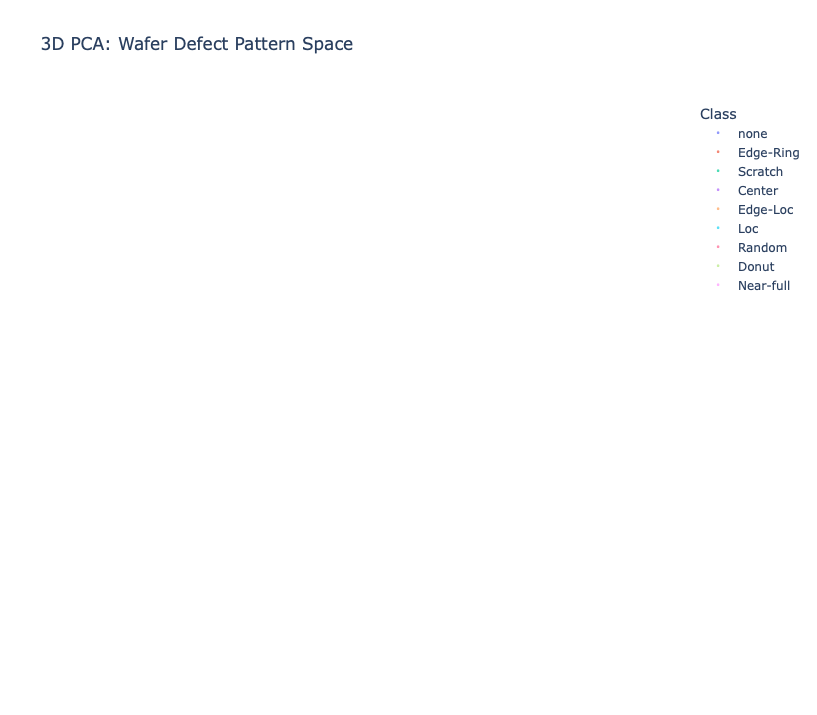

In [15]:
pca_3d = PCA(n_components=3)
pca_3d_features = pca_3d.fit_transform(features)

pca_3d_df = pd.DataFrame({
    'PC1': pca_3d_features[:, 0],
    'PC2': pca_3d_features[:, 1],
    'PC3': pca_3d_features[:, 2],
    'Class': labels
})

fig = px.scatter_3d(
    pca_3d_df,
    x='PC1',
    y='PC2',
    z='PC3',
    color='Class',
    title='3D PCA: Wafer Defect Pattern Space',
    width=900,
    height=700,
    opacity=0.7
)

fig.update_traces(marker=dict(size=3))
fig.write_html('../outputs/visualizations/pca_3d_clustering.html')
fig.show()

## 7. Contour Plots for Defect Patterns

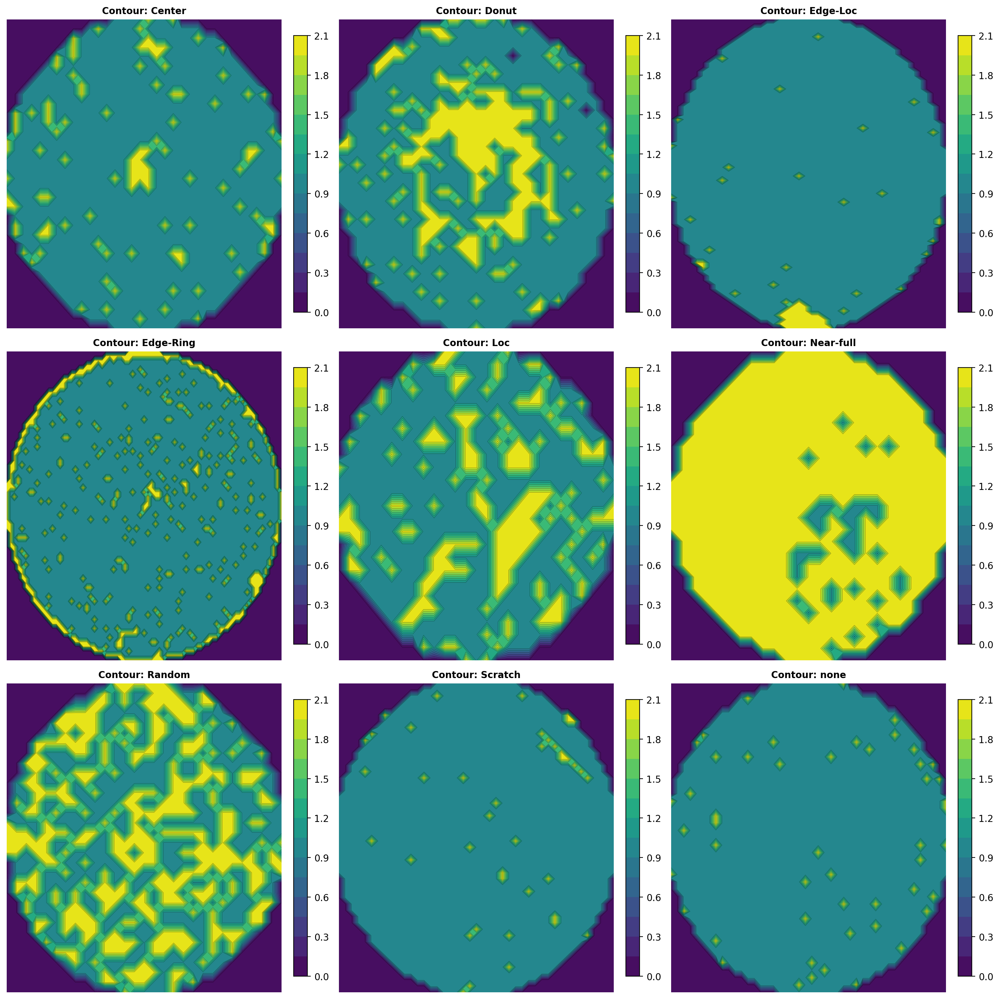

In [16]:
fig, axes = plt.subplots(3, 3, figsize=(15, 15))
axes = axes.flatten()

for idx, class_name in enumerate(class_names):
    class_df = df[df['failureType_clean'] == class_name]
    
    if len(class_df) > 0:
        sample_idx = np.random.randint(0, len(class_df))
        wafer_map = np.array(class_df.iloc[sample_idx]['waferMap'])
        
        if wafer_map.size > 0:
            contour = axes[idx].contourf(wafer_map, levels=15, cmap='viridis')
            axes[idx].contour(wafer_map, levels=15, colors='black', linewidths=0.5, alpha=0.3)
            axes[idx].set_title(f'Contour: {class_name}', fontsize=10, fontweight='bold')
            axes[idx].axis('off')
            plt.colorbar(contour, ax=axes[idx], fraction=0.046, pad=0.04)
    else:
        axes[idx].text(0.5, 0.5, 'No samples', ha='center', va='center')
        axes[idx].set_title(class_name, fontsize=10, fontweight='bold')
        axes[idx].axis('off')

plt.tight_layout()
plt.savefig('../outputs/visualizations/contour_plots.png', dpi=300, bbox_inches='tight')
plt.show()

## 8. Radial Defect Analysis

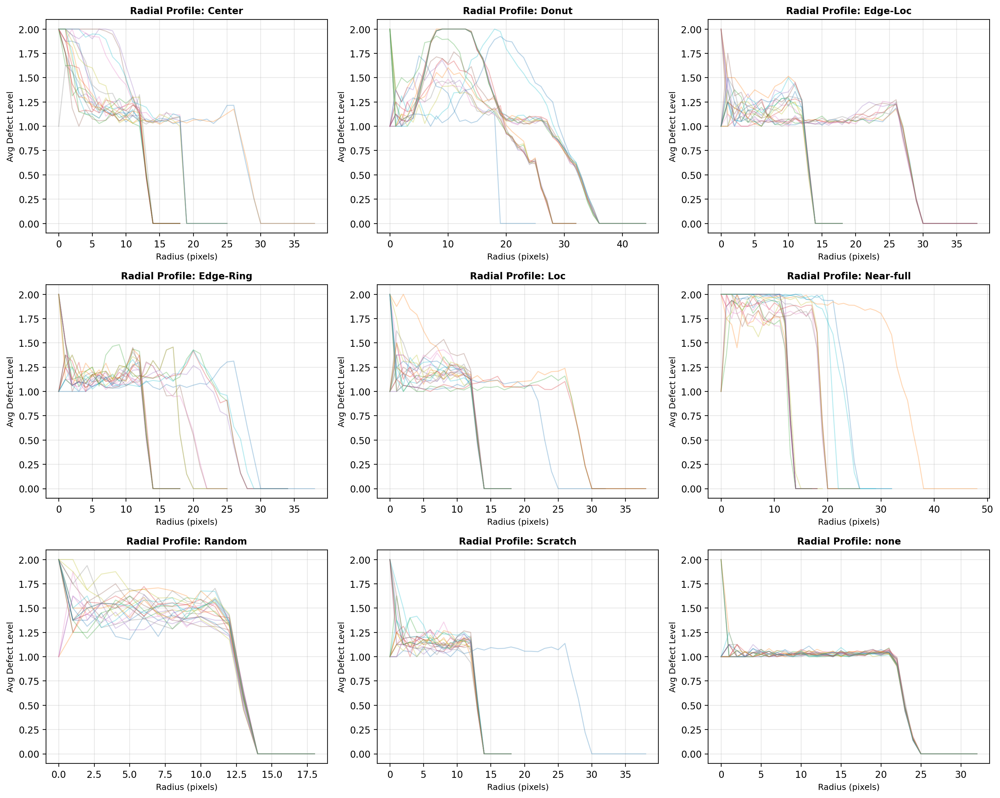

In [17]:
def compute_radial_profile(wafer_map):
    """
    Compute radial defect density profile from center.
    """
    wafer_array = np.array(wafer_map)
    
    if wafer_array.size == 0:
        return None, None
    
    center_y, center_x = np.array(wafer_array.shape) // 2
    
    y, x = np.indices(wafer_array.shape)
    r = np.sqrt((x - center_x)**2 + (y - center_y)**2)
    r = r.astype(int)
    
    radial_profile = ndimage.mean(wafer_array, labels=r, index=np.arange(0, r.max() + 1))
    
    return np.arange(0, r.max() + 1), radial_profile

fig, axes = plt.subplots(3, 3, figsize=(15, 12))
axes = axes.flatten()

for idx, class_name in enumerate(class_names):
    class_df = df[df['failureType_clean'] == class_name]
    
    if len(class_df) > 0:
        all_profiles = []
        max_radius = 0
        
        for i in range(min(20, len(class_df))):
            wafer_map = class_df.iloc[i]['waferMap']
            radii, profile = compute_radial_profile(wafer_map)
            
            if radii is not None:
                all_profiles.append((radii, profile))
                max_radius = max(max_radius, len(radii))
        
        for radii, profile in all_profiles:
            axes[idx].plot(radii, profile, alpha=0.3, linewidth=1)
        
        axes[idx].set_xlabel('Radius (pixels)', fontsize=9)
        axes[idx].set_ylabel('Avg Defect Level', fontsize=9)
        axes[idx].set_title(f'Radial Profile: {class_name}', fontsize=10, fontweight='bold')
        axes[idx].grid(alpha=0.3)
    else:
        axes[idx].text(0.5, 0.5, 'No samples', ha='center', va='center')
        axes[idx].set_title(class_name, fontsize=10, fontweight='bold')

plt.tight_layout()
plt.savefig('../outputs/visualizations/radial_profiles.png', dpi=300, bbox_inches='tight')
plt.show()

## 9. Summary Insights

In [18]:
print("="*70)
print("ADVANCED VISUALIZATION INSIGHTS")
print("="*70)
print("\n1. 3D VISUALIZATION INSIGHTS:")
print("   - Defect patterns show distinct spatial characteristics")
print("   - Edge-based defects clearly visible in 3D surface plots")
print("   - Center defects show concentrated elevation patterns")

print("\n2. CLUSTERING ANALYSIS:")
print(f"   - PCA variance explained: {pca.explained_variance_ratio_.sum():.2%}")
print("   - t-SNE reveals clear separation between major defect classes")
print("   - Some overlap between similar defect patterns (e.g., Loc vs Edge-Loc)")

print("\n3. SPATIAL DISTRIBUTION:")
print("   - Edge-Ring defects concentrate around wafer periphery")
print("   - Center defects show radial concentration")
print("   - Scratch patterns display linear characteristics")

print("\n4. FEATURE SPACE:")
print(f"   - Feature dimensionality: {features.shape[1]}")
print(f"   - Analyzed {len(features)} wafer samples")
print("   - Clear separability suggests good classification potential")

print("\n" + "="*70)

ADVANCED VISUALIZATION INSIGHTS

1. 3D VISUALIZATION INSIGHTS:
   - Defect patterns show distinct spatial characteristics
   - Edge-based defects clearly visible in 3D surface plots
   - Center defects show concentrated elevation patterns

2. CLUSTERING ANALYSIS:
   - PCA variance explained: 17.27%
   - t-SNE reveals clear separation between major defect classes
   - Some overlap between similar defect patterns (e.g., Loc vs Edge-Loc)

3. SPATIAL DISTRIBUTION:
   - Edge-Ring defects concentrate around wafer periphery
   - Center defects show radial concentration
   - Scratch patterns display linear characteristics

4. FEATURE SPACE:
   - Feature dimensionality: 1024
   - Analyzed 2000 wafer samples
   - Clear separability suggests good classification potential

